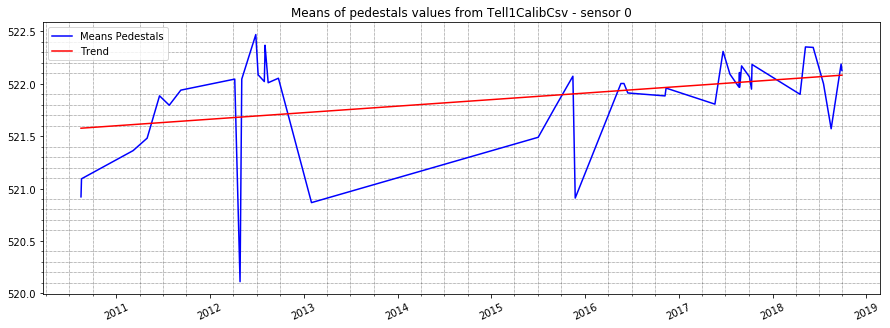

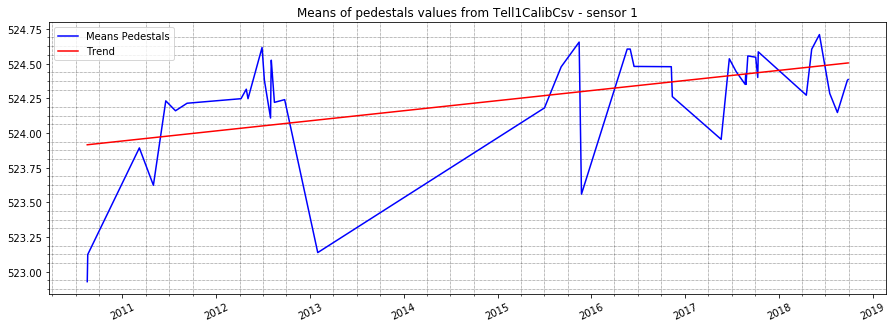

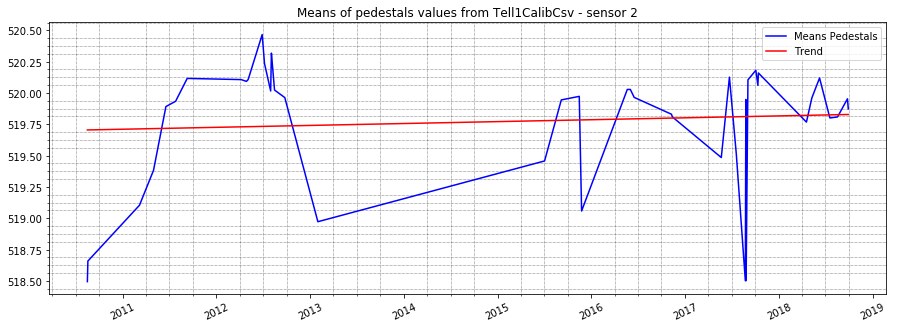

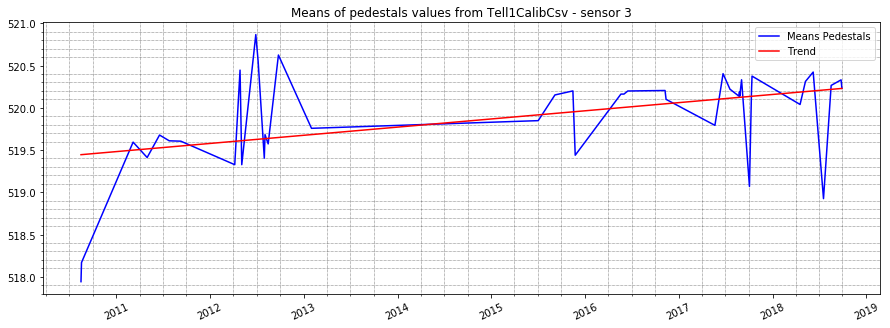

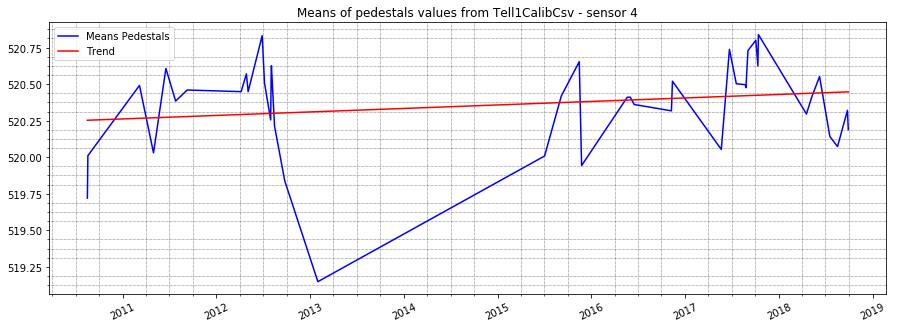

...

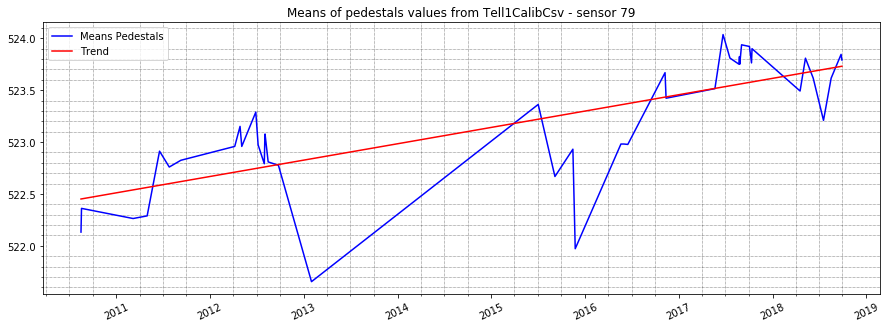

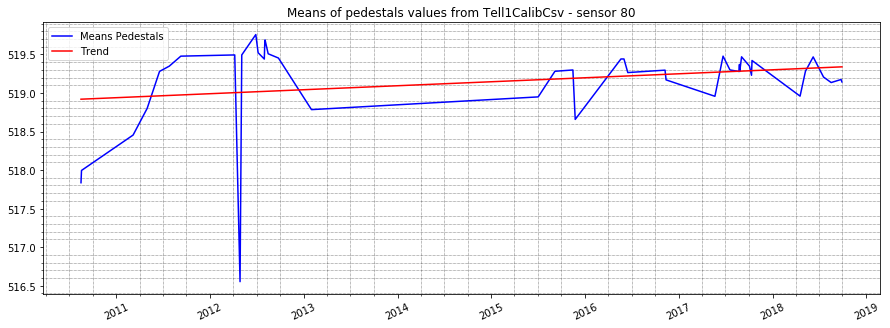

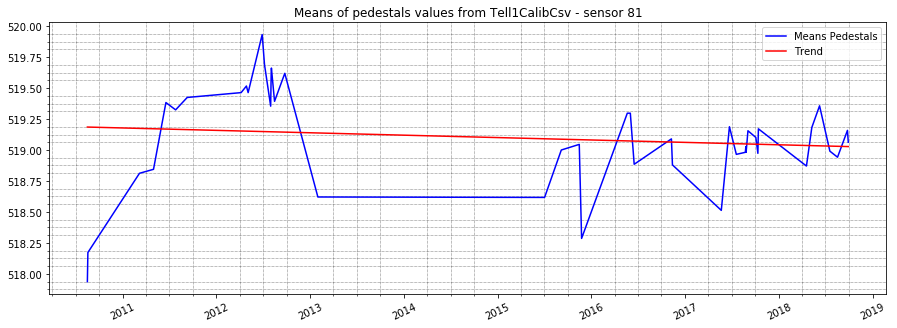

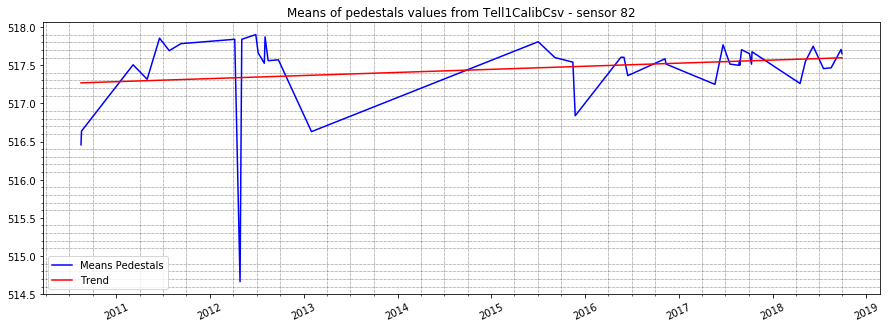

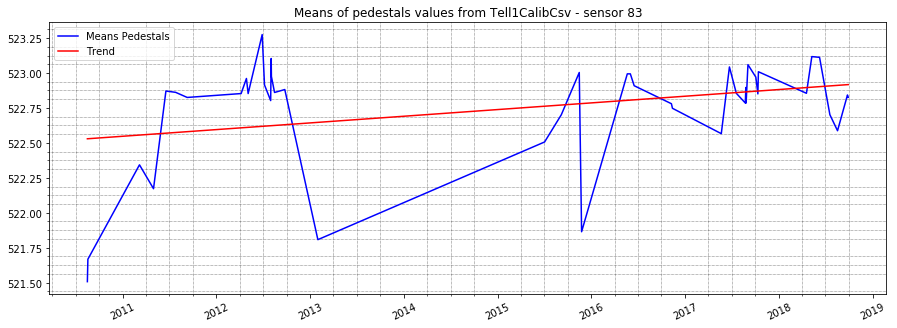

In [3]:
from sklearn.linear_model import LinearRegression
import datetime, time
import glob
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from utilities import calculate_trend

files_calib = glob.glob("D:/Praca Magisterska/nowe/Tell1CalibCsv/*.csv")

for i in range(0,84):
    sensor_number = i

    means_pedestals_sensor = []
    calib_timestamps_pedestals = []
    for file in files_calib:
        file_name = os.path.basename(file)
        file_name_timestamp = datetime.datetime.strptime(file_name, '%Y_%m_%d-%H_%M_%S.csv')
        calib_timestamps_pedestals.append(file_name_timestamp)

        data = pd.read_csv(file ,sep=' ', header=None, usecols=range(2,2050), skiprows=range(84,350))
        means_pedestals_sensor.append(data.loc[sensor_number,:].mean())

    # Calculate trends
    dates_numbers = []
    for date in calib_timestamps_pedestals:
        dates_numbers.append(time.mktime(date.timetuple()))

    # Means Sensor
    linear_regressor = LinearRegression()  # create object for the class
    linear_regressor.fit(np.array(dates_numbers).reshape(-1, 1), means_pedestals_sensor)  # perform linear regression
    means_pedestals_sensor_trend = linear_regressor.predict(np.array(dates_numbers).reshape(-1, 1)) # make predictions

    fig, ax = plt.subplots()
    ax.set_title('Means of pedestals values from Tell1CalibCsv - sensor {}'.format(sensor_number))
    ax.plot(calib_timestamps_pedestals, means_pedestals_sensor, 'b', label='Means Pedestals')
    ax.plot(calib_timestamps_pedestals, means_pedestals_sensor_trend, 'r', label='Trend')

    plt.xticks(rotation=25)
    plt.rcParams['figure.figsize'] = [15,5]
    ax.minorticks_on()
    ax.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    ax.legend()
    plt.show()

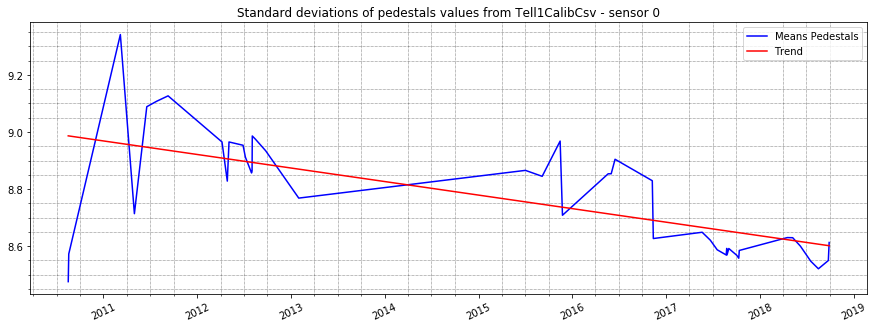

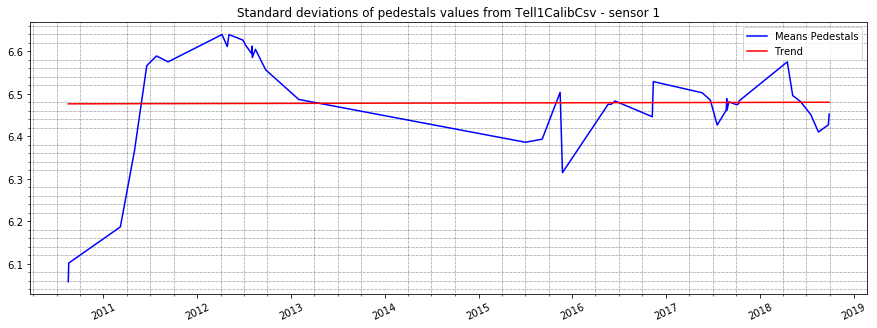

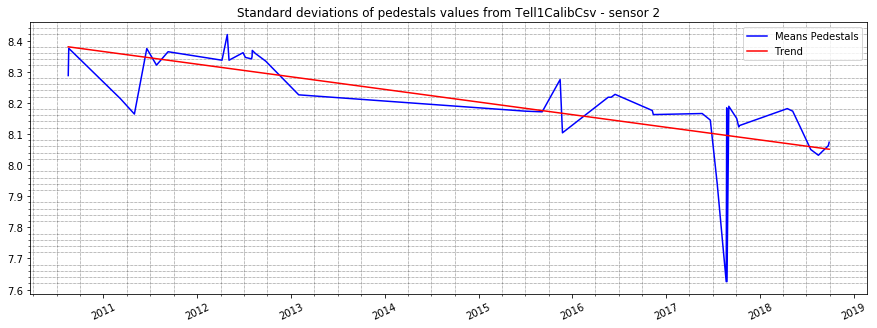

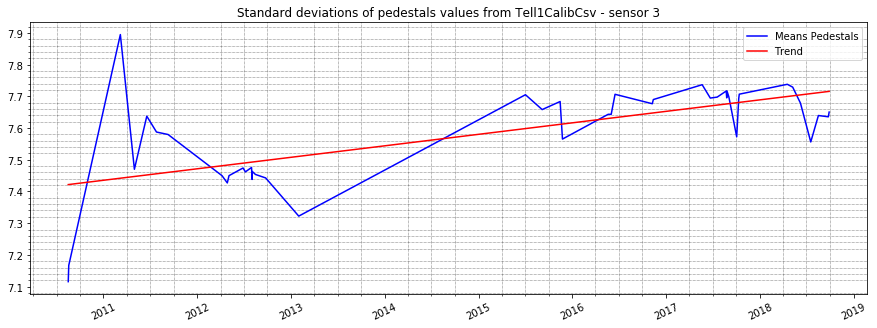

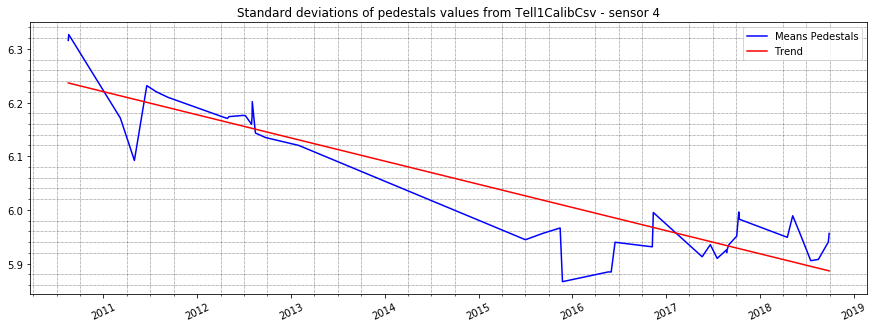

...

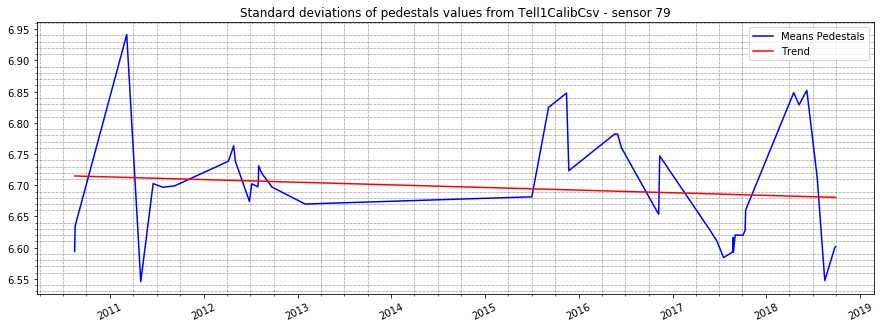

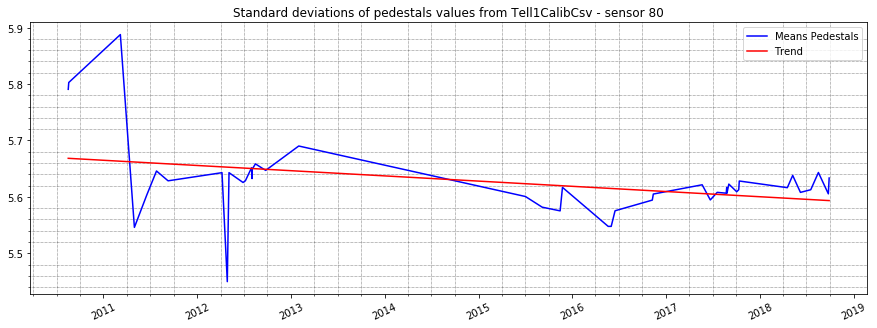

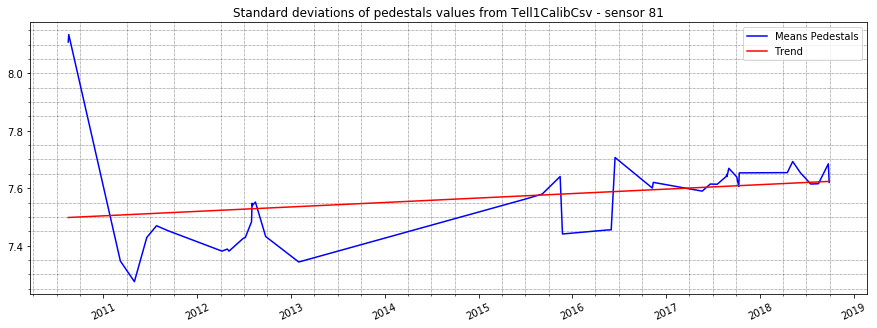

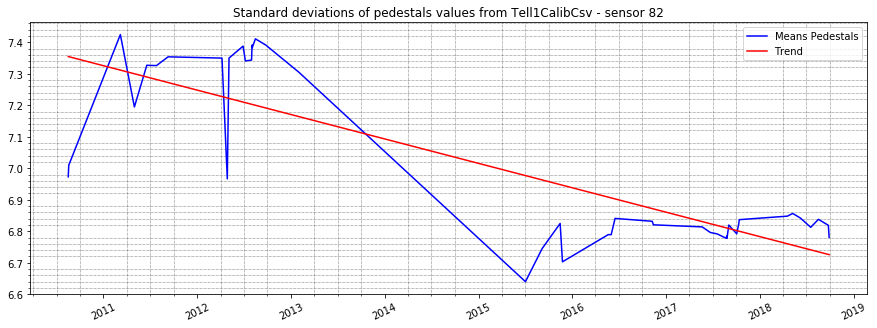

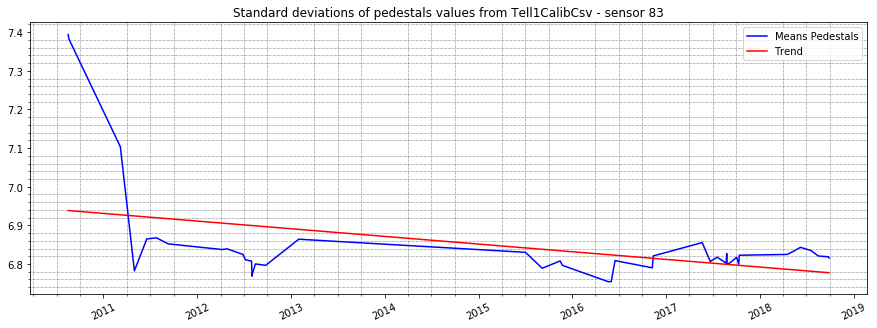

In [4]:
for i in range(0,84):
    sensor_number = i

    stddevs_pedestals_sensor = []
    calib_timestamps_pedestals = []
    for file in files_calib:
        file_name = os.path.basename(file)
        file_name_timestamp = datetime.datetime.strptime(file_name, '%Y_%m_%d-%H_%M_%S.csv')
        calib_timestamps_pedestals.append(file_name_timestamp)

        data = pd.read_csv(file ,sep=' ', header=None, usecols=range(2,2050), skiprows=range(84,350))
        stddevs_pedestals_sensor.append(data.loc[sensor_number,:].std())

    # Calculate trends
    dates_numbers = []
    for date in calib_timestamps_pedestals:
        dates_numbers.append(time.mktime(date.timetuple()))

    # Stddevs Sensor
    linear_regressor = LinearRegression()  # create object for the class
    linear_regressor.fit(np.array(dates_numbers).reshape(-1, 1), stddevs_pedestals_sensor)  # perform linear regression
    stddevs_pedestals_sensor_trend = linear_regressor.predict(np.array(dates_numbers).reshape(-1, 1)) # make predictions

    fig, ax = plt.subplots()
    ax.set_title('Standard deviations of pedestals values from Tell1CalibCsv - sensor {}'.format(sensor_number))
    ax.plot(calib_timestamps_pedestals, stddevs_pedestals_sensor, 'b', label='Means Pedestals')
    ax.plot(calib_timestamps_pedestals, stddevs_pedestals_sensor_trend, 'r', label='Trend')

    plt.xticks(rotation=25)
    plt.rcParams['figure.figsize'] = [15,5]
    ax.minorticks_on()
    ax.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    ax.legend()
    plt.show()

#### Total:

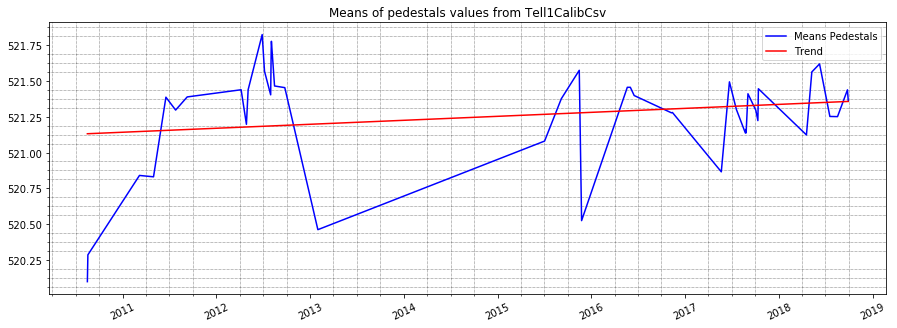

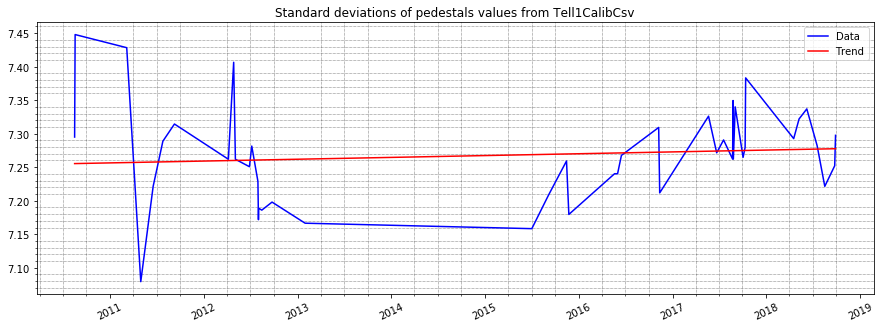

In [5]:
means_pedestals = []
stddevs_pedestals = []
calib_timestamps_pedestals = []
for file in files_calib:
    file_name = os.path.basename(file)
    file_name_timestamp = datetime.datetime.strptime(file_name, '%Y_%m_%d-%H_%M_%S.csv')
    calib_timestamps_pedestals.append(file_name_timestamp)
    
    data = pd.read_csv(file ,sep=' ', header=None, usecols=range(2,2050), skiprows=range(84,350))
    mean_pedestals = data.mean().mean()
    stddev_pedestals = data.stack().std()
    means_pedestals.append(mean_pedestals)
    stddevs_pedestals.append(stddev_pedestals)

# Calculate trends
dates_numbers = []
for date in calib_timestamps_pedestals:
    dates_numbers.append(time.mktime(date.timetuple()))

# Means
linear_regressor = LinearRegression()  # create object for the class
linear_regressor.fit(np.array(dates_numbers).reshape(-1, 1), means_pedestals)  # perform linear regression
means_pedestals_trend = linear_regressor.predict(np.array(dates_numbers).reshape(-1, 1)) # make predictions

# Stddevs
linear_regressor = LinearRegression()  # create object for the class
linear_regressor.fit(np.array(dates_numbers).reshape(-1, 1), stddevs_pedestals)  # perform linear regression
stddevs_pedestals_trend = linear_regressor.predict(np.array(dates_numbers).reshape(-1, 1)) # make predictions

fig, ax = plt.subplots()
ax.set_title('Means of pedestals values from Tell1CalibCsv')
ax.plot(calib_timestamps_pedestals, means_pedestals, 'b', label='Means Pedestals')
ax.plot(calib_timestamps_pedestals, means_pedestals_trend, 'r', label='Trend')
plt.xticks(rotation=25)
plt.rcParams['figure.figsize'] = [15,5]
ax.minorticks_on()
ax.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
ax.legend()
plt.show()

fig, ax = plt.subplots()
ax.set_title('Standard deviations of pedestals values from Tell1CalibCsv')
ax.plot(calib_timestamps_pedestals, stddevs_pedestals, 'b', label='Data')
ax.plot(calib_timestamps_pedestals, stddevs_pedestals_trend, 'r', label='Trend')
plt.xticks(rotation=25)
plt.rcParams['figure.figsize'] = [15,5]
ax.minorticks_on()
ax.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
ax.legend()
plt.show()